## This notebook demonstrates how to find empty regions in mosaics on the STRW cluster using the `strw_lofar_data_utils` package. It covers:
- Loading mosaic data and PyBDSF source catalogues
- Using the Mosaic class's find_empty_regions method to identify low-source-density areas
- Configuring parameters for empty region detection (cutout size, max sources, grid step, separation)
- Sorting and selecting the emptiest regions
- Generating and visualizing cutouts of identified empty regions

Note: The code in this notebook is rather slow and is not optimized for speed. I stopped developing it further as it is not very useful for the work I do, but I am keeping it here for reference and as an example of how to use the `find_empty_regions` method of the `Mosaic` class.

# Import necessary libraries and modules:

In [2]:
from astropy.table import Table
import os

from src.core.mosaic import get_mosaic_by_field_name
from src.core.vizualization import Vizualizer

# Get a test mosaic and load the source (comp) catalogue

In [3]:
mosaic_names = ['P026+29', 'P13Hetdex12', 'P340+21']
test_mosaic = mosaic_names[0]

mosaic = get_mosaic_by_field_name(test_mosaic)

In [4]:
# Filepath to field
field_filepath = f"/net/vdesk/data2/penchev/project_data/data/{test_mosaic}"
comp_cat_filename = "LoTSS_predicted_v0.comp.fits"

# Read in the catalogues using astropy.table.Table to handle endianness
comp_cat = Table.read(
    os.path.join(field_filepath, comp_cat_filename)
).to_pandas()

In [5]:
print(comp_cat.columns)
comp_cat.head()

Index(['Source_Name', 'RA', 'E_RA', 'DEC', 'E_DEC', 'Peak_flux', 'E_Peak_flux',
       'Total_flux', 'E_Total_flux', 'Maj', 'E_Maj', 'Min', 'E_Min', 'DC_Maj',
       'E_DC_Maj', 'DC_Min', 'E_DC_Min', 'PA', 'E_PA', 'DC_PA', 'E_DC_PA',
       'Isl_rms', 'S_Code', 'Component_Name'],
      dtype='object')


,Source_Name,RA,E_RA,DEC,E_DEC,Peak_flux,E_Peak_flux,Total_flux,E_Total_flux,Maj,...,E_DC_Maj,DC_Min,E_DC_Min,PA,E_PA,DC_PA,E_DC_PA,Isl_rms,S_Code,Component_Name
0,b'ILTJ015222.27+283017.9',28.092632,0.000162,28.503662,0.000124,0.983999,0.166547,1.333437,0.356697,7.732866,...,0.000396,0.000544,0.000272,69.261735,38.632593,69.261735,38.632593,0.000158,b'S',b'ILTJ015222.23+283013.1'
1,b'ILTJ015222.27+283017.9',28.092946,0.000200,28.506016,0.000103,1.062838,0.166062,1.723441,0.408039,9.404761,...,0.000478,0.000444,0.000230,80.165903,20.055127,80.165903,20.055127,0.000158,b'S',b'ILTJ015222.31+283021.6'
2,b'ILTJ015218.18+284220.4',28.075740,0.000302,28.705691,0.000225,0.944620,0.161464,3.872498,0.809313,15.039469,...,0.000777,0.002158,0.000428,119.770366,23.070428,119.770366,23.070428,0.000164,b'S',b'ILTJ015218.18+284220.4'
3,b'ILTJ015210.22+284646.0',28.042587,0.000048,28.779454,0.000138,9.763950,0.170340,72.202314,1.770572,30.191908,...,0.000329,0.002815,0.000106,98.519641,3.091641,98.519641,3.091641,0.000170,b'M',b'ILTJ015210.22+284646.0'
4,b'ILTJ015200.08+282348.8',28.000329,0.000045,28.396897,0.000048,5.141231,0.170731,18.194092,0.802225,12.347579,...,0.000144,0.001066,0.000060,48.452900,3.689563,48.452900,3.689563,0.000171,b'M',b'ILTJ015200.08+282348.8'


# Find th empty regions in the mosaic using the `find_empty_regions` method of the `Mosaic` class.

This method takes in the pybdsf catalogue and various parameters to define what constitutes an 'empty' region.

In [7]:
empty_regions = mosaic.find_empty_regions(
    pybdsf_catalog = comp_cat,
    ra_key = "RA",
    dec_key = "DEC",
    size_arcmin = None, # leave to None to avoid conflicting with size_pixels
    size_pixels = 300, # size of the cutout in pixels (if size_arcmin is None)
    max_sources = 10,
    grid_step_arcmin = None, # this defualts to using half the size of the cutout (size_pixels or size_arcmin)
    grid_step_pixels = None, # this defualts to using half the size of the cutout (size_pixels or size_arcmin)
    min_separation_arcmin = None # this defualts to using the size of the cutout (size_pixels or size_arcmin)
)

print(f"Found {len(empty_regions)} empty regions in mosaic {test_mosaic}.")
empty_regions.head()

Scanning RA-DEC grid:  15%|█▍        | 8/55 [00:02<00:14,  3.22it/s]

Filtering close regions: 100%|██████████| 1513/1513 [07:53<00:00,  3.19it/s]

Found 306 empty regions in mosaic P026+29.


,ra,dec,num_sources
0,24.706117,29.692417,1.0
1,25.456117,29.379917,1.0
2,27.206117,28.004917,1.0
3,27.018617,27.129917,1.0
4,27.206117,27.379917,1.0


We can sort the empty regions by the number of sources in the cutout, and visualize some of the 'emptiest' regions using the `Vizualizer` class.

In [11]:
# Sort by ascending number of sources num_sources
empty_regions_sorted = empty_regions.sort_values('num_sources', ascending=True)

# Get the RA DEC coordinates from the sorted empty regions
ra_list = empty_regions_sorted['ra'].values[4:14]
dec_list = empty_regions_sorted['dec'].values[4:14]

In [12]:
from src.pipelines import generate_cutouts

ra_dec_list = list(zip(ra_list, dec_list))
cutouts = generate_cutouts(
    ra_dec_list=ra_dec_list,
    size_pixels = 300,
    save=False,
)

Generating cutouts: 100%|██████████| 10/10 [00:00<00:00, 315.31it/s]


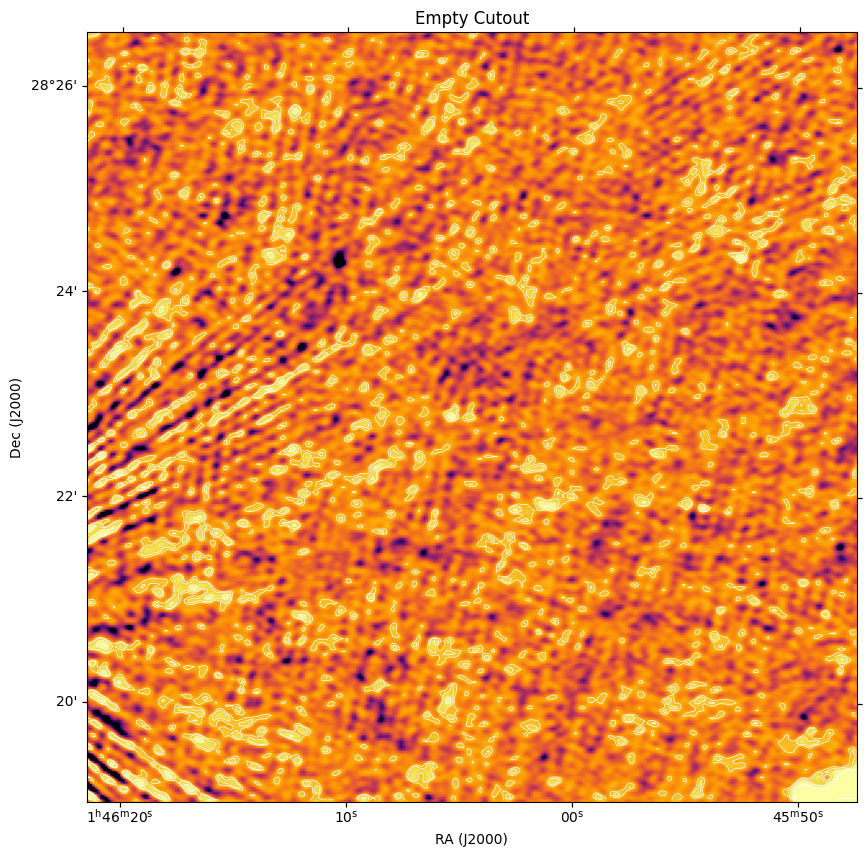

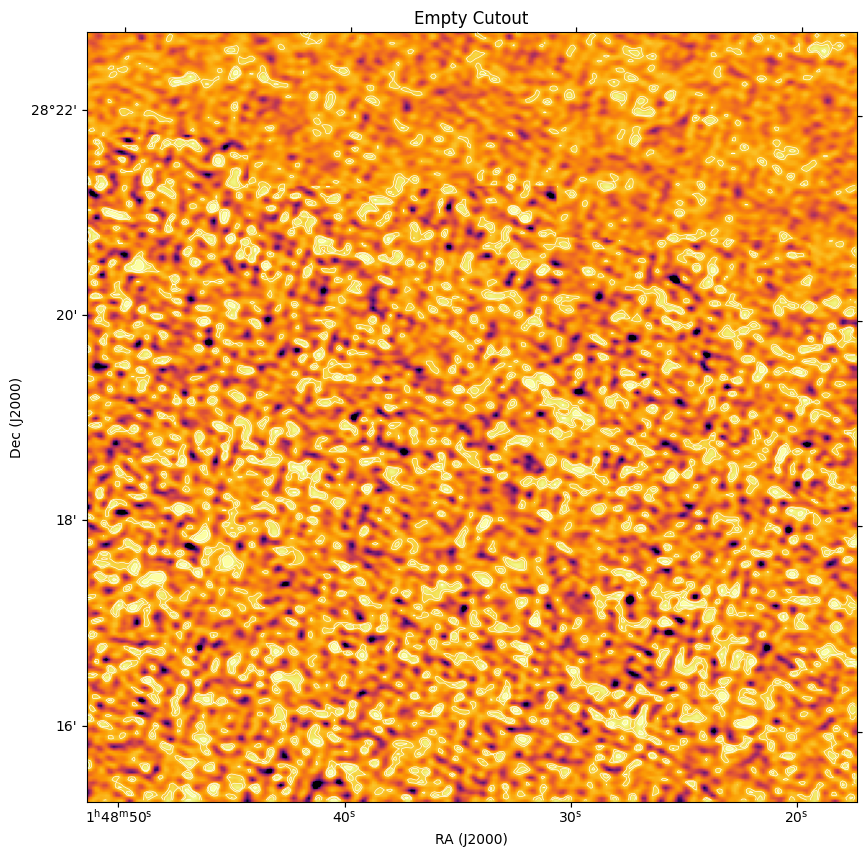

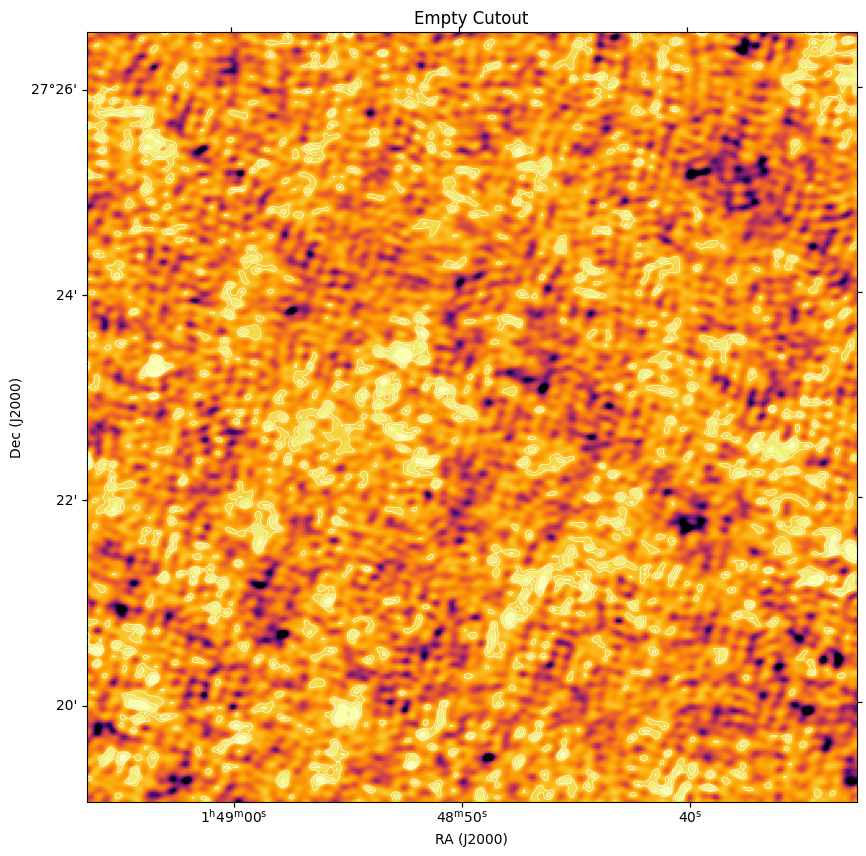

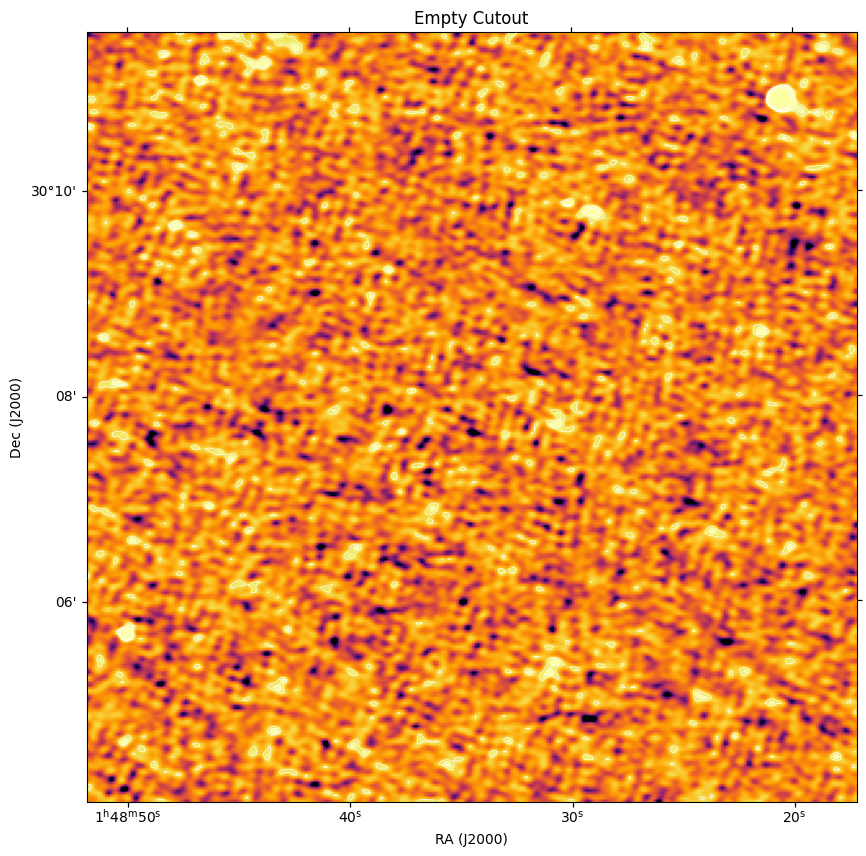

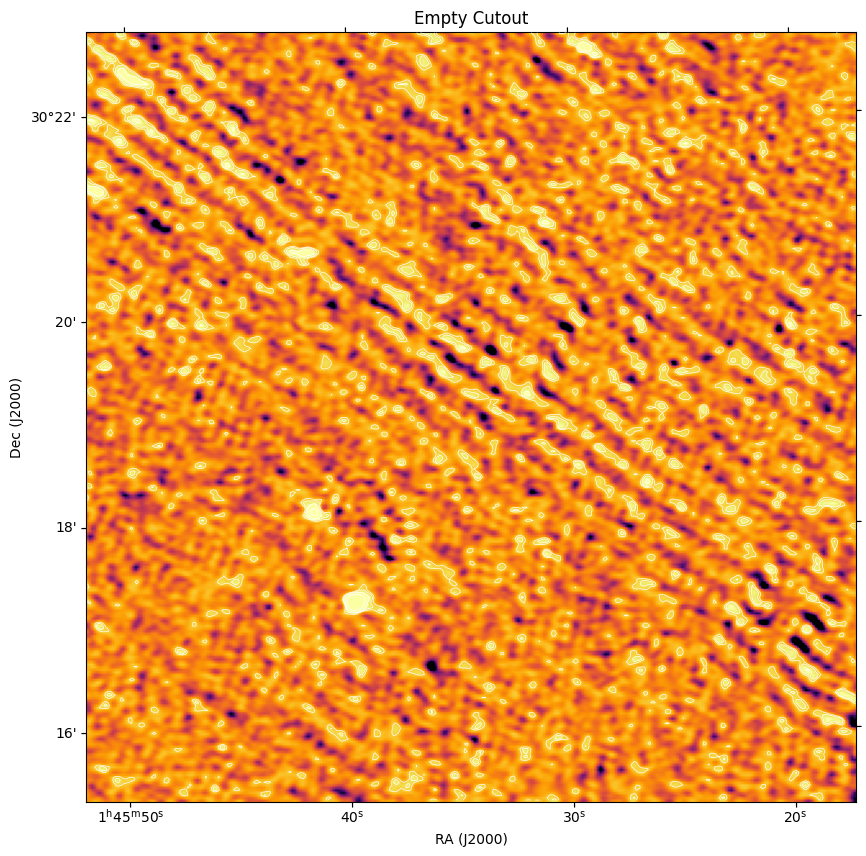

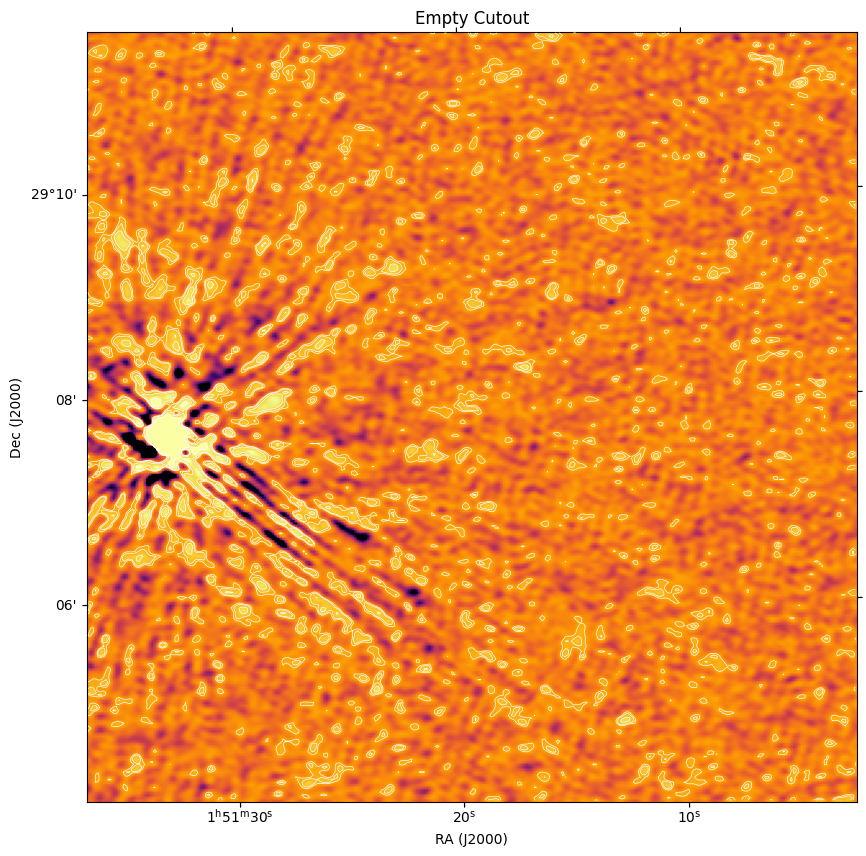

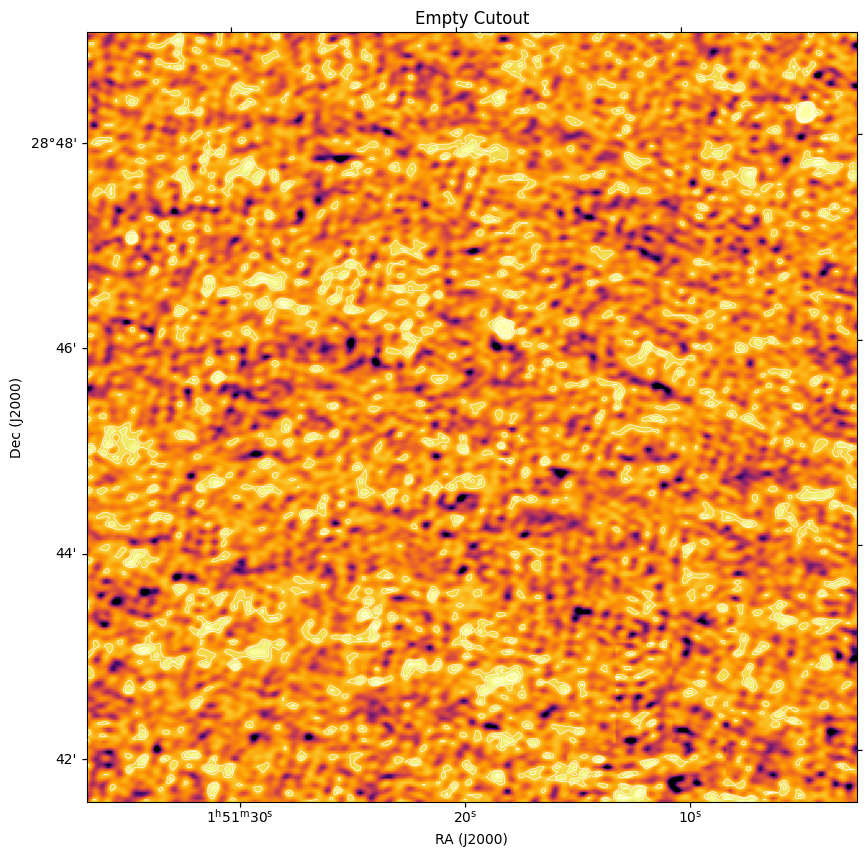

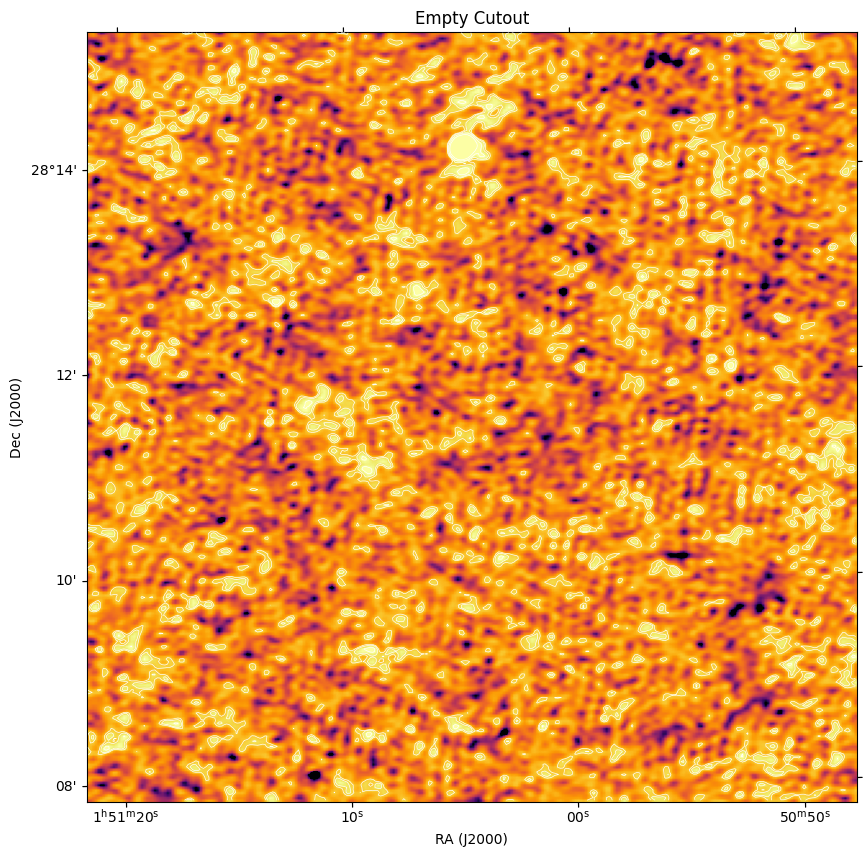

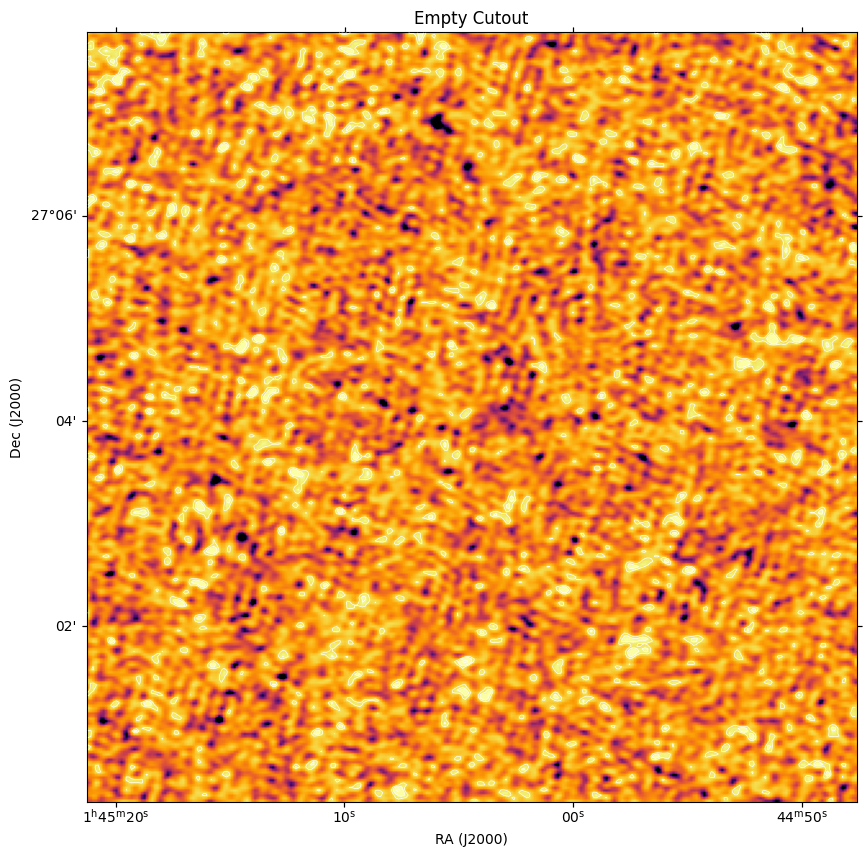

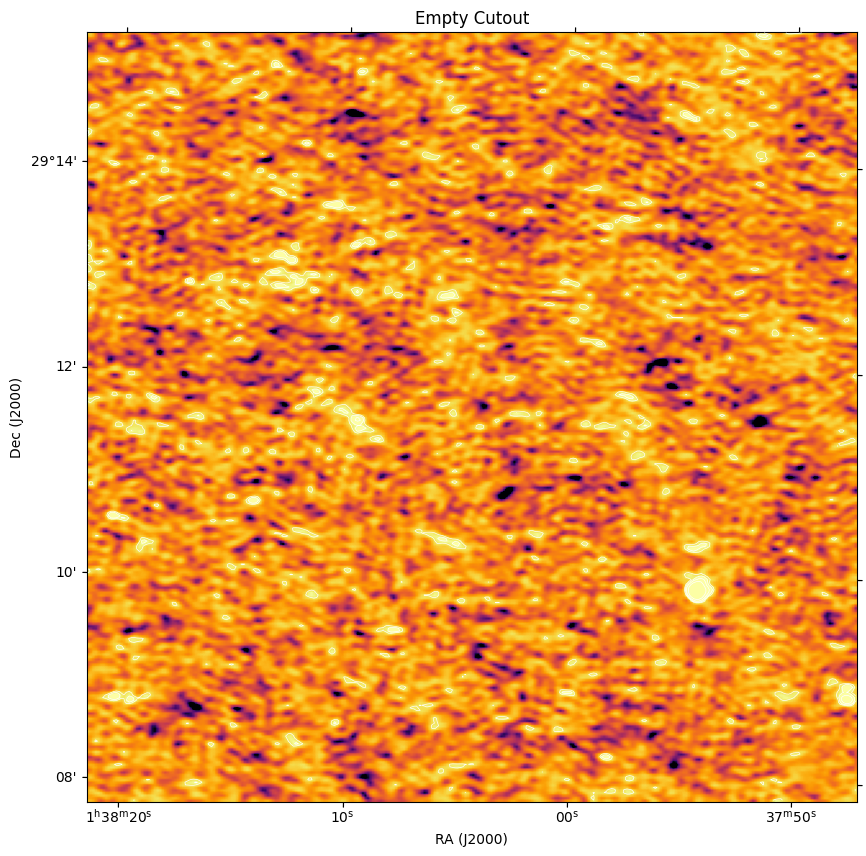

In [13]:
for i in range(10):
    cutout = cutouts[i]
    Vizualizer().vizualize_a_cutout(cutout, title = "Empty Cutout", contour_levels = [2, 3, 5, 10])